# Import the required libraries

In [2]:
from segmentation import segmentation
import tensorflow as tf
import segmentation_models as sm
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

Segmentation Models: using `tf.keras` framework.


# Setup the file locations and structures

In order to use our method, make sure your directory Structre should be as follow :

PATH=path/to/folder/


        .train_imgs//
                        .train//
                               image1
                               image2
                               ...
        .train_mask//
                        .train//
                               mask1
                               mask2
                               ...
                               
                               
        .val_imgs//
                        .val//
                               image1
                               image2
                               ...
        .val_mask//
                        .val//
                               mask1
                               mask2
                               ...
                               
        .test_imgs//
                        .test//
                               image1
                               image2
                               ... 
        .pred (this is an empty folder for storing the predicted mask for the test images)
                               

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('../'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
#PATH to your datafolder
PATH ='../data/image_and_masks/'

# Segmentation Class Usage 

A segmentation class has been created for convenient usage of our method. There are some defined functions that can be called 

* train() : train the model. use callback to record the best val_iou_score
* plot_history() : to plot the loss history of your training and validation set
* create_augmentation() : create the albumentation augmentation. If you need specific augmentation, go in the class and tweak that function to have an appropriate augmentation pipeline
* save_model() : to save the weights of your trained model.
* show_predictions() : to compare the predictions of our model with the ground truth 
* predict_unlabeled() : to predict the mask of unlabeled images you have in the test_imgs folder

In [4]:
#LABELS of your segmentation task
LABELS=["background",'virus']
params={'backbone':'mobilenet',
        'loss':[tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)],
        'weights':[1],
        'augmentation': True,
        'weights_pretrained':'imagenet',
        'batch_size':32,
        'steps_per_epoch':20,
        'n_epochs':30,
        'encoder_freeze': False}

# Train the model using the above setup

In [ ]:
seg = segmentation(PATH,LABELS,params=params)

# You can also load a model from the saved model

In [16]:
model = sm.Unet('mobilenet', encoder_weights='imagenet',classes=2, activation='softmax', encoder_freeze=False)
model.load_weights("./model/cp-0030.ckpt")

# Show prediction of the training set

Show the 10 images with the prediction mask from the training set.
The arrow points the virus that we need to identify. The dashed arrow shows the suspected virus, which is similar to virus but not confirmed.So we will not label it.

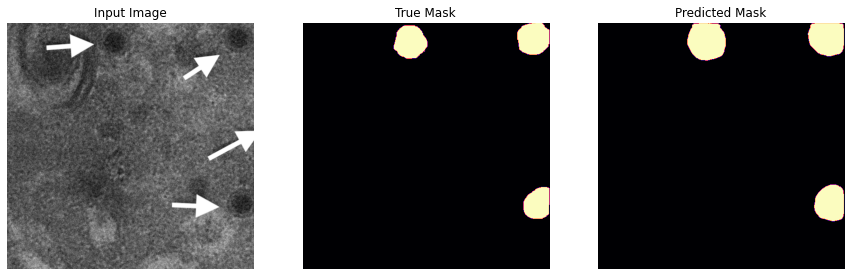

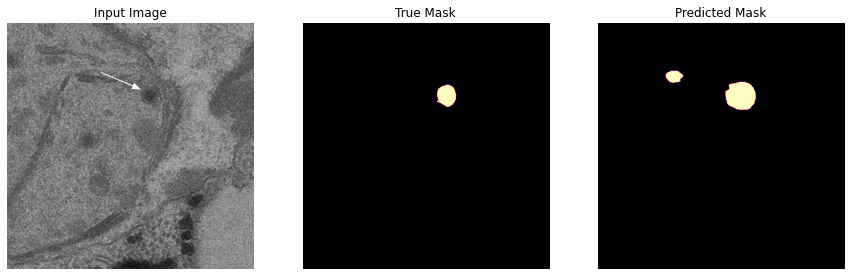

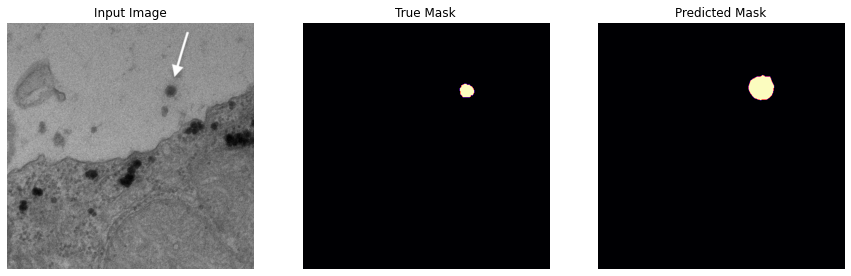

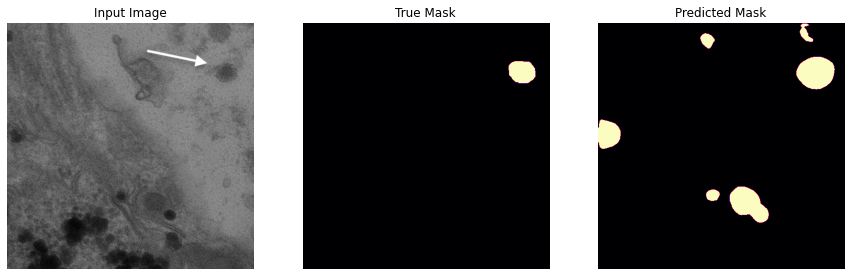

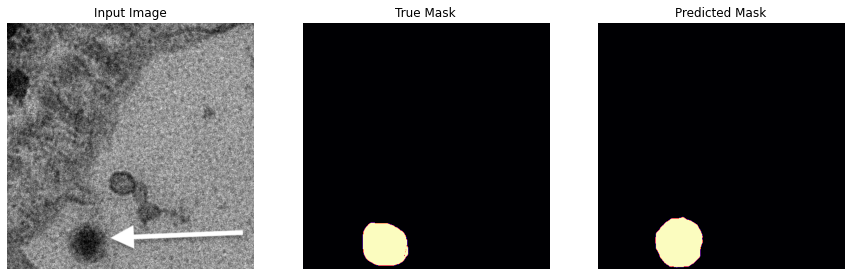

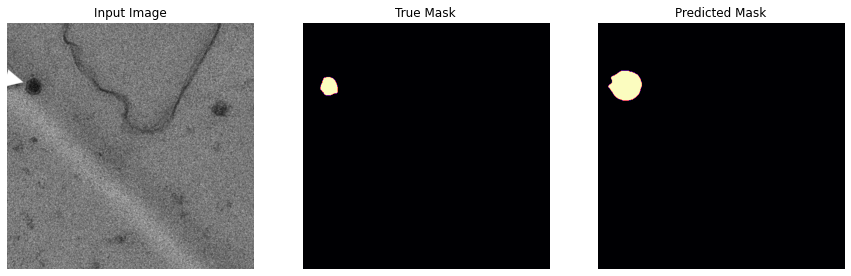

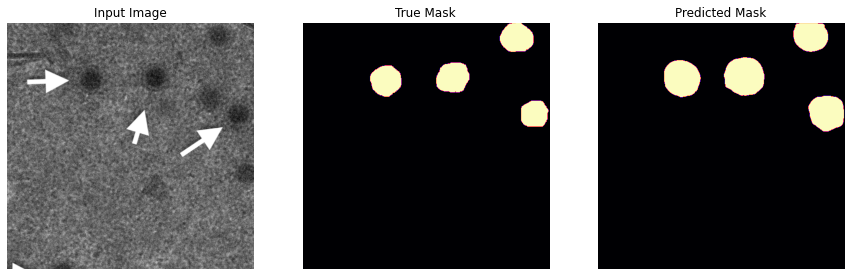

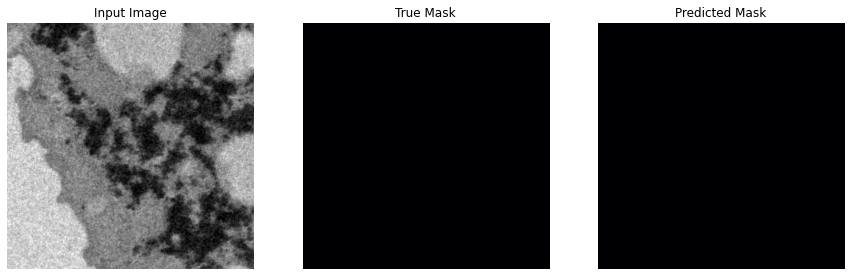

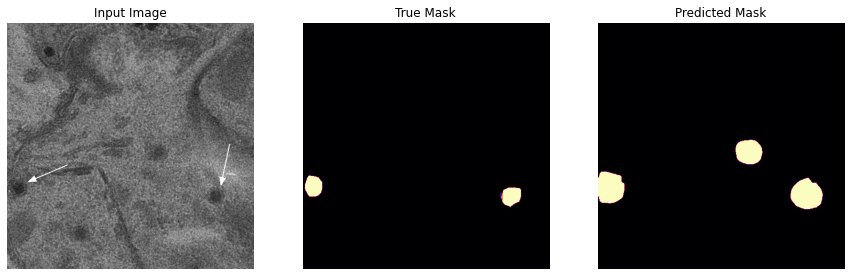

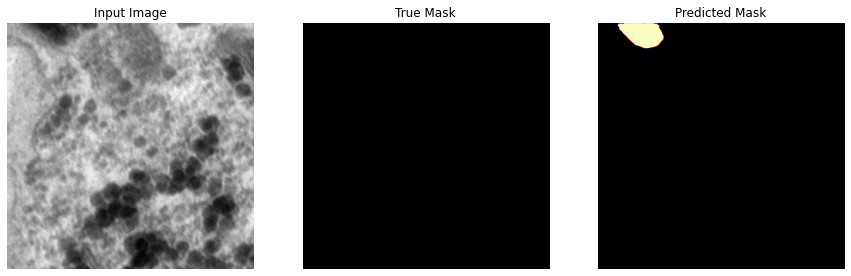

In [13]:
seg.show_predictions()

# Show prediction of the test set

Found 44 images belonging to 1 classes.


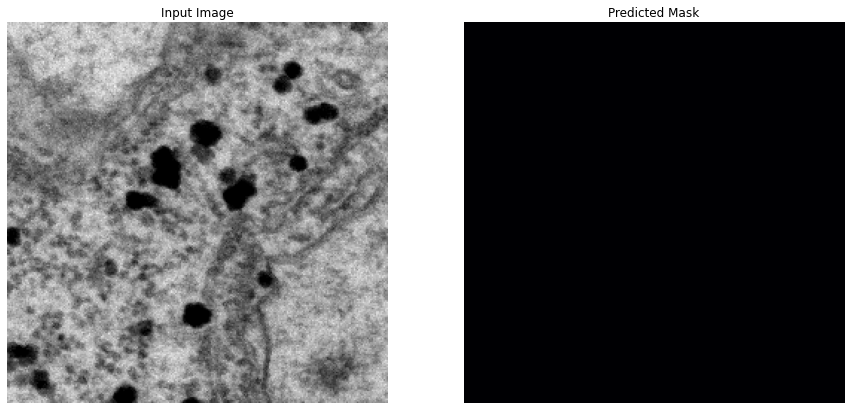

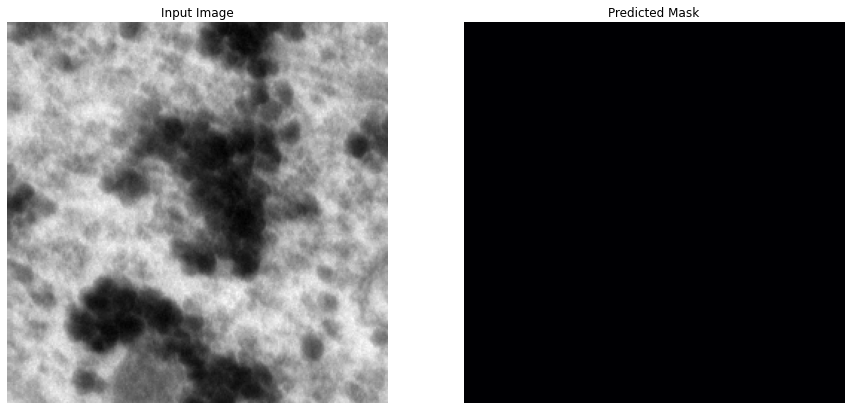

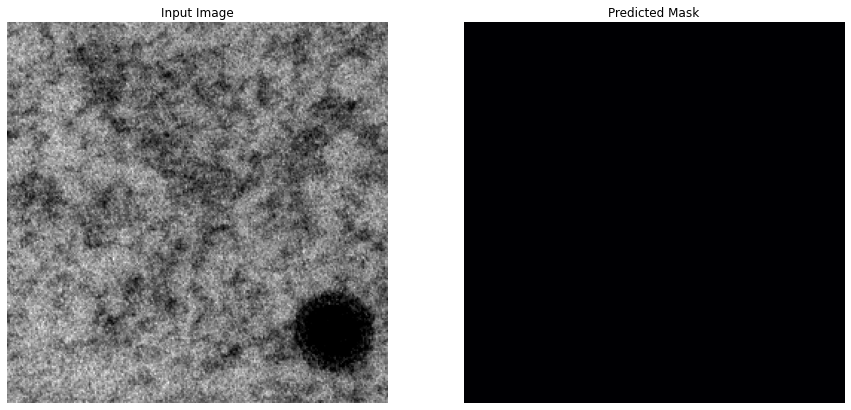

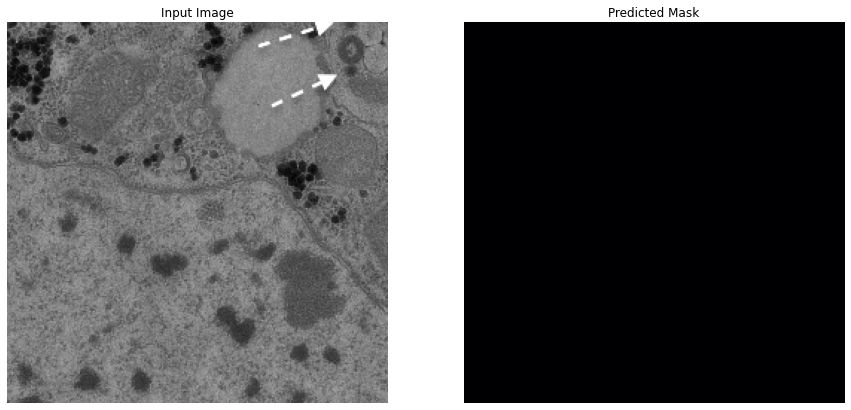

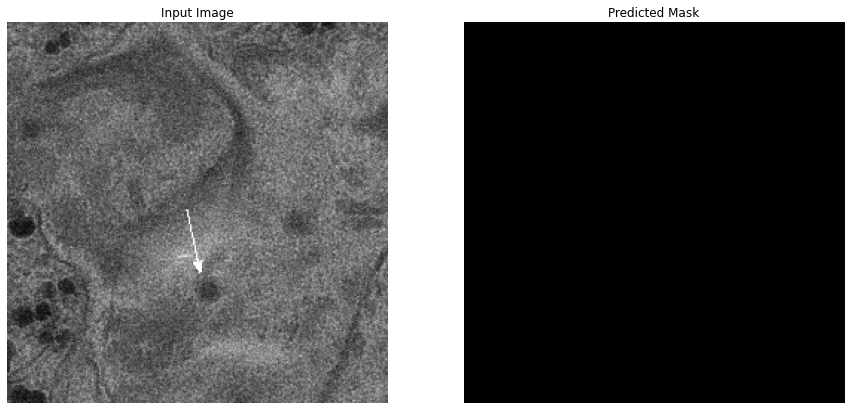

...

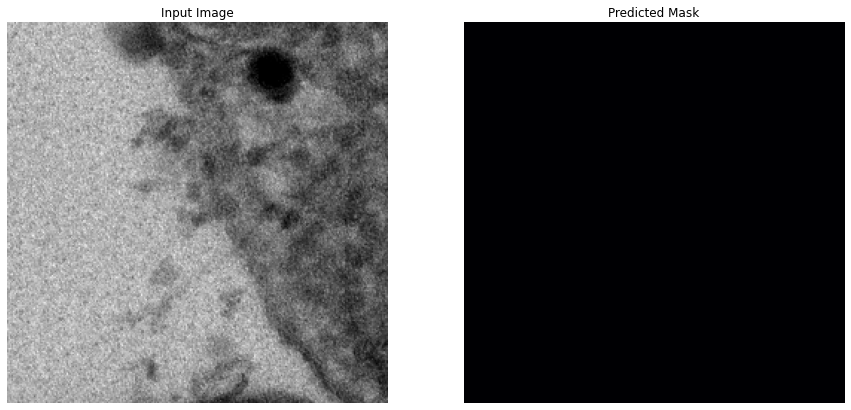

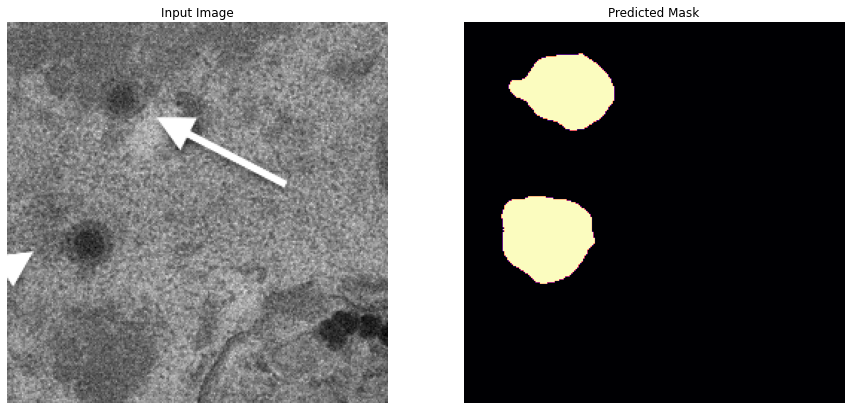

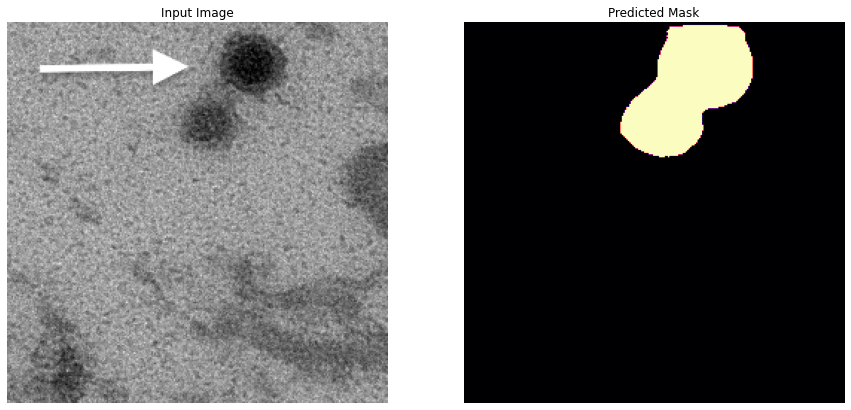

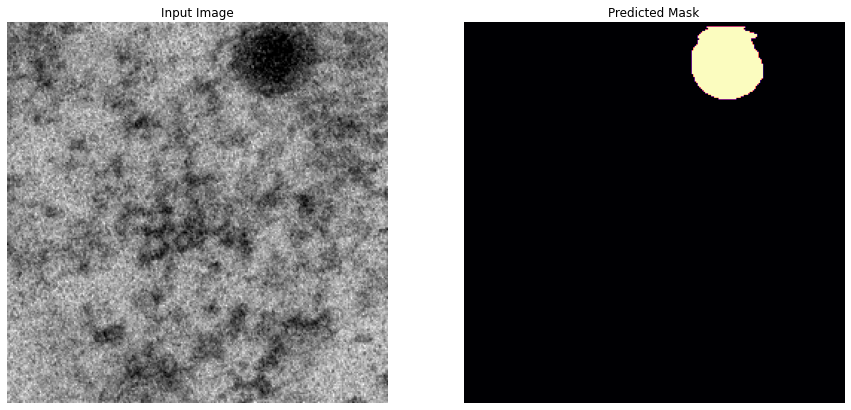

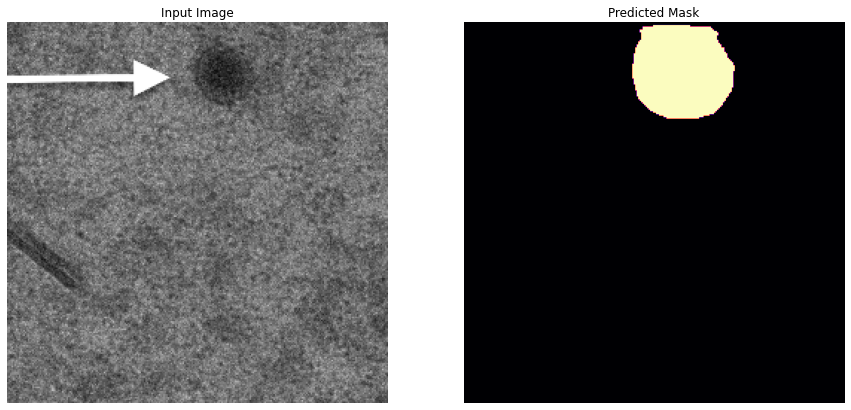

In [15]:
pred=seg.predict_unlabeled(PATH)